# Restaurant Recommendation Engine

## Overview
The Restaurant Recommendation Engine is a Python-based project that utilizes data from Yelp to recommend restaurants based on user location and preferences. The project employs data analysis and machine learning techniques, specifically K-Means clustering, to categorize restaurants and provide recommendations.

## Installing libraries

In [157]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import plotly
import plotly.offline as py
import plotly.graph_objs as go
import plotly_express as px
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

## Load the dataset

In [159]:
df = pd.read_json('yelp_academic_dataset_business.json', lines=True)
df.head

<bound method NDFrame.head of                    business_id                      name  \
0       Pns2l4eNsfO8kk83dixA6A  Abby Rappoport, LAC, CMQ   
1       mpf3x-BjTdTEA3yCZrAYPw             The UPS Store   
2       tUFrWirKiKi_TAnsVWINQQ                    Target   
3       MTSW4McQd7CbVtyjqoe9mw        St Honore Pastries   
4       mWMc6_wTdE0EUBKIGXDVfA  Perkiomen Valley Brewery   
...                        ...                       ...   
150341  IUQopTMmYQG-qRtBk-8QnA              Binh's Nails   
150342  c8GjPIOTGVmIemT7j5_SyQ      Wild Birds Unlimited   
150343  _QAMST-NrQobXduilWEqSw         Claire's Boutique   
150344  mtGm22y5c2UHNXDFAjaPNw  Cyclery & Fitness Center   
150345  jV_XOycEzSlTx-65W906pg                   Sic Ink   

                                address           city state postal_code  \
0                1616 Chapala St, Ste 2  Santa Barbara    CA       93101   
1       87 Grasso Plaza Shopping Center         Affton    MO       63123   
2                  52

In [160]:
df.shape

(150346, 14)

## Exploratory Data Analysis

Create data frame for Restaurants category

In [162]:
df['restaurants'] = df['categories'].str.contains('Restaurants')
df.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,restaurants
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None,False
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ...",False


In [163]:
df_restaurants = df.loc[df.restaurants == True]
df_restaurants.head()
df_restaurants.info()

<class 'pandas.core.frame.DataFrame'>
Index: 52268 entries, 3 to 150340
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   business_id   52268 non-null  object 
 1   name          52268 non-null  object 
 2   address       52268 non-null  object 
 3   city          52268 non-null  object 
 4   state         52268 non-null  object 
 5   postal_code   52268 non-null  object 
 6   latitude      52268 non-null  float64
 7   longitude     52268 non-null  float64
 8   stars         52268 non-null  float64
 9   review_count  52268 non-null  int64  
 10  is_open       52268 non-null  int64  
 11  attributes    51703 non-null  object 
 12  categories    52268 non-null  object 
 13  hours         44990 non-null  object 
 14  restaurants   52268 non-null  object 
dtypes: float64(3), int64(2), object(10)
memory usage: 6.4+ MB


In [164]:
df_restaurants.shape

(52268, 15)

### Plot the data

Create plot for Restaurants' stars/ratings 

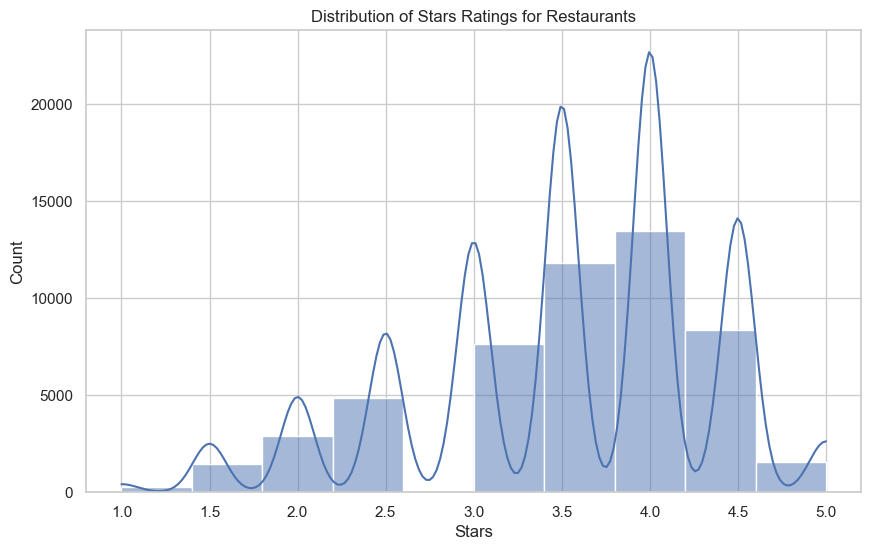

In [166]:
# Set the Seaborn style
sns.set(style="whitegrid")

# Plot the distribution of stars ratings for restaurants
plt.figure(figsize=(10, 6))
sns.histplot(df_restaurants['stars'], bins=10, kde=True)
plt.title('Distribution of Stars Ratings for Restaurants')
plt.xlabel('Stars')
plt.ylabel('Count')
plt.show()

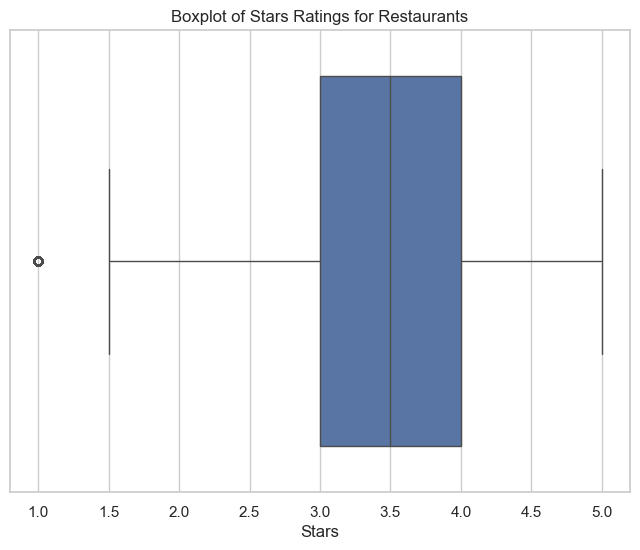

In [167]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=df_restaurants['stars'])
plt.title('Boxplot of Stars Ratings for Restaurants')
plt.xlabel('Stars')
plt.show()

In [168]:
top_restaurants = df_restaurants.sort_values(by=['review_count', 'stars'], ascending=False)[:20]
top_restaurants.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,restaurants
113731,_ab50qdWOk0DdB6XOrBitw,Acme Oyster House,724 Iberville St,New Orleans,LA,70130,29.954273,-90.068965,4.0,7568,1,"{'RestaurantsTakeOut': 'True', 'Alcohol': ''fu...","Live/Raw Food, Seafood, Restaurants, Cajun/Creole","{'Monday': '11:0-22:0', 'Thursday': '11:0-22:0...",True
112552,ac1AeYqs8Z4_e2X5M3if2A,Oceana Grill,739 Conti St,New Orleans,LA,70130,29.956231,-90.067563,4.0,7400,1,"{'RestaurantsGoodForGroups': 'True', 'Restaura...","Restaurants, Seafood, Cajun/Creole, Breakfast ...","{'Monday': '8:0-1:0', 'Tuesday': '8:0-1:0', 'W...",True
91757,GXFMD0Z4jEVZBCsbPf4CTQ,Hattie B’s Hot Chicken - Nashville,112 19th Ave S,Nashville,TN,37203,36.151387,-86.796603,4.5,6093,1,"{'RestaurantsGoodForGroups': 'True', 'Business...","American (Traditional), Chicken Shop, Southern...","{'Monday': '0:0-0:0', 'Tuesday': '11:0-16:0', ...",True
143157,ytynqOUb3hjKeJfRj5Tshw,Reading Terminal Market,51 N 12th St,Philadelphia,PA,19107,39.953341,-75.158855,4.5,5721,1,"{'RestaurantsGoodForGroups': 'True', 'Restaura...","Candy Stores, Shopping, Department Stores, Fas...","{'Monday': '8:0-18:0', 'Tuesday': '8:0-18:0', ...",True
147081,oBNrLz4EDhiscSlbOl8uAw,Ruby Slipper - New Orleans,200 Magazine St,New Orleans,LA,70130,29.951025,-90.067394,4.5,5193,1,"{'NoiseLevel': ''loud'', 'Caters': 'False', 'B...","Restaurants, American (Traditional), American ...","{'Monday': '0:0-0:0', 'Tuesday': '7:30-14:0', ...",True


Create plot for top 20 restaurants

C:\Users\braja\AppData\Local\Temp\ipykernel_7092\736283773.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




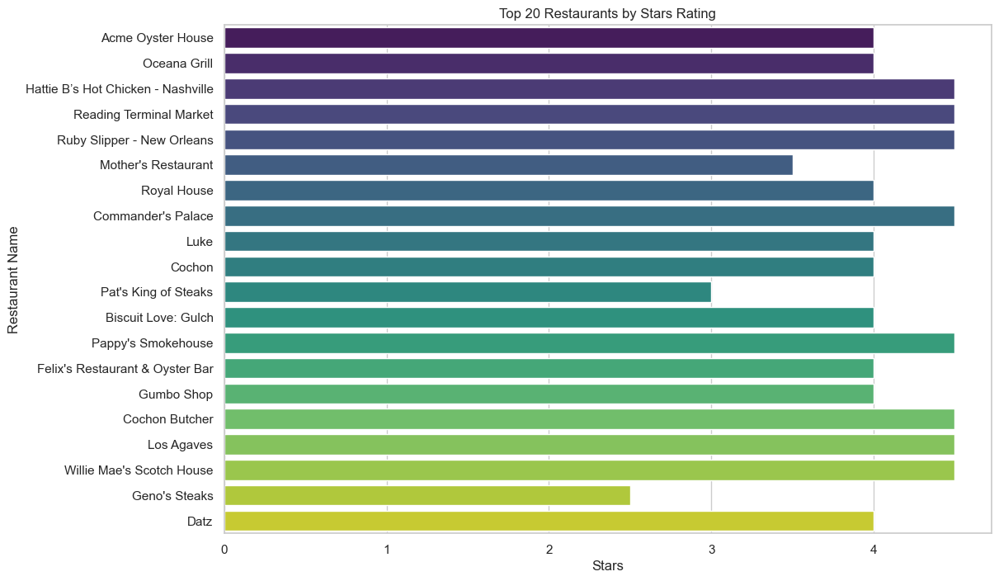

In [169]:
# Set the figure size
plt.figure(figsize=(12, 8))

# Create the bar plot
sns.barplot(data=top_restaurants, x='stars', y='name', palette='viridis')

# Set plot labels and title
plt.xlabel('Stars')
plt.ylabel('Restaurant Name')
plt.title('Top 20 Restaurants by Stars Rating')
plt.show()

And next, create mapbox for Restaurants in Philadelphia, PA.

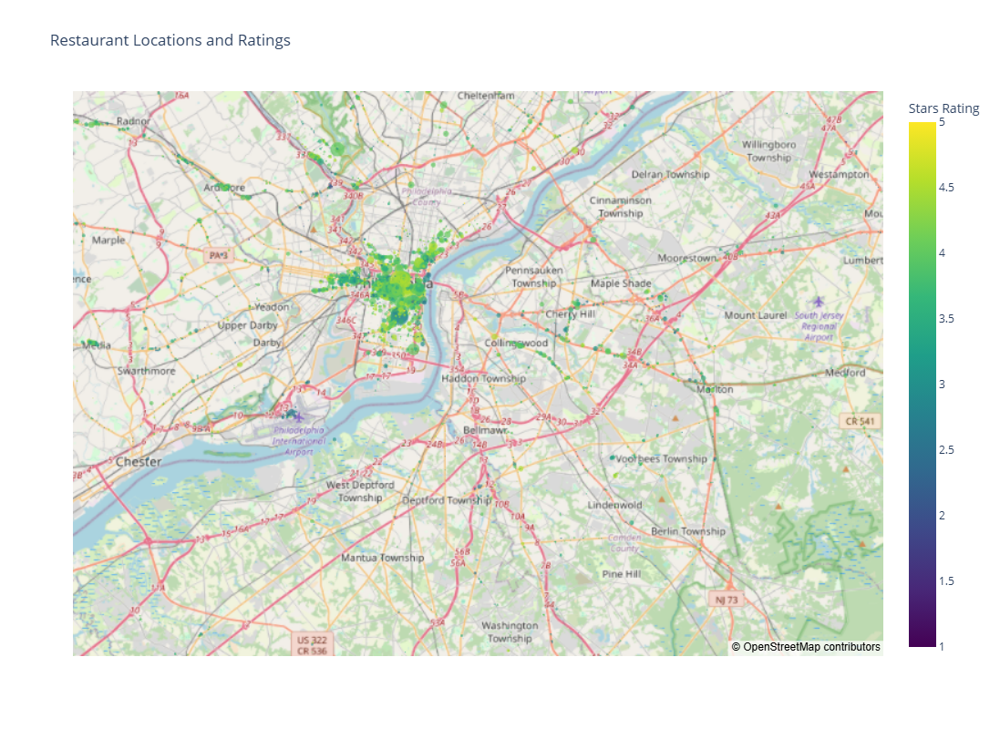

In [170]:
# Filter for restaurants with non-null latitude and longitude
restaurant_df = df[(df['restaurants'] == True) & (df['latitude'].notnull()) & (df['longitude'].notnull())]

# Create a scatter mapbox
fig = px.scatter_mapbox(
    restaurant_df,
    lat='latitude',
    lon='longitude',
    color='stars',  # Color by stars
    size='review_count',   # Size of the markers based on stars
    hover_name='name',  # Show restaurant name on hover
    hover_data=['city', 'state', 'stars'],  # Show city, state, and stars rating
    color_continuous_scale='Viridis',  # Color scale
    title='Restaurant Locations and Ratings',
    labels={'stars': 'Stars Rating'}
)

# Update mapbox settings to use a map style (e.g., 'open-street-map')
fig.update_layout(
    mapbox_style="open-street-map",
    mapbox_zoom=10,  # Adjust zoom level
    width=1200,
    height=800,
    mapbox_center={"lat": 39.9, "lon": -75.1}  # Center of the map (you can adjust the coordinates)
)

# Show the plot
fig.show()


## K-Means Clustering

In [172]:
df.isnull().sum()

business_id         0
name                0
address             0
city                0
state               0
postal_code         0
latitude            0
longitude           0
stars               0
review_count        0
is_open             0
attributes      13744
categories        103
hours           23223
restaurants       103
dtype: int64

In [173]:
# Group by 'state' and count the number of restaurants in each state
restaurant_count_by_state = df[df['restaurants'] == True].groupby('state').size()

# Display the result
print(restaurant_count_by_state)


state
AB      2410
AZ      2671
CA      1161
CO         1
DE       961
FL      8731
HI         1
ID      1302
IL       983
IN      4150
LA      3640
MO      4247
MT         1
NC         1
NJ      3341
NV      1673
PA     12641
TN      4352
XMS        1
dtype: int64


Create clustering model using KMeans Clustering

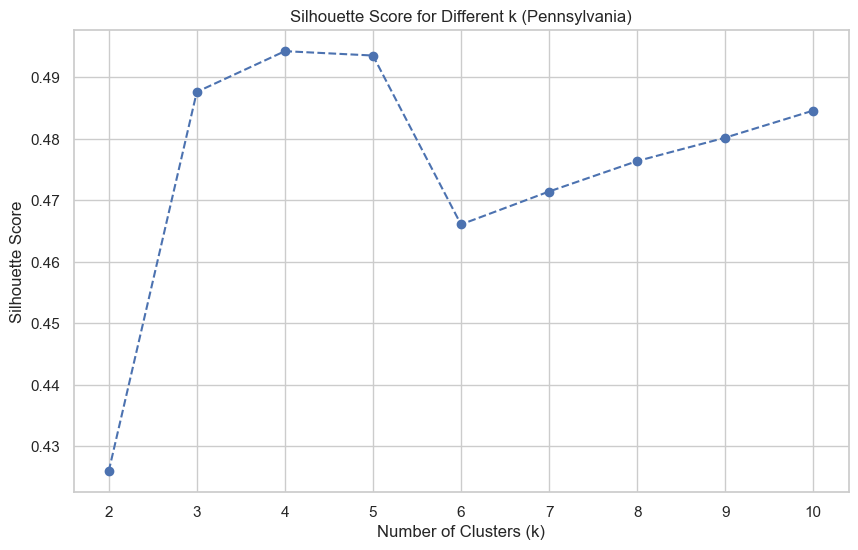

Silhouette Scores for each k:
k = 2: 0.42597440697364103
k = 3: 0.48763655715197124
k = 4: 0.49426284982958574
k = 5: 0.4935553594167367
k = 6: 0.466087708696308
k = 7: 0.4714443836387321
k = 8: 0.47639373204586943
k = 9: 0.48019743409361176
k = 10: 0.48460736242711966


In [174]:
# Step 1: Filter data for Pennsylvania
# This filters the DataFrame for rows where 'state' is 'Pennsylvania'
pennsylvania_df = df[df['state'] == 'PA']  # Adjust if needed for specific city filtering

# Step 2: Extract features (latitude and longitude for clustering, or other numerical features)
X = pennsylvania_df[['latitude', 'longitude']]  # Use latitude and longitude, adjust as needed

# Step 3: Scale the data (important for clustering)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 4: Run K-Means clustering for different values of k (2 to 10)
sil_scores = []

for k in range(2, 11):  # K-Means requires at least 2 clusters
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=10, random_state=42)
    kmeans.fit(X_scaled)
    
    # Calculate the silhouette score for the current clustering
    score = silhouette_score(X_scaled, kmeans.labels_)
    sil_scores.append(score)

# Step 5: Plot silhouette scores for each k
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), sil_scores, marker='o', linestyle='--')
plt.title('Silhouette Score for Different k (Pennsylvania)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

# Step 6: Print silhouette scores for each k
print("Silhouette Scores for each k:")
for k, score in zip(range(2, 11), sil_scores):
    print(f'k = {k}: {score}')


C:\Users\braja\AppData\Local\Temp\ipykernel_7092\156757590.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



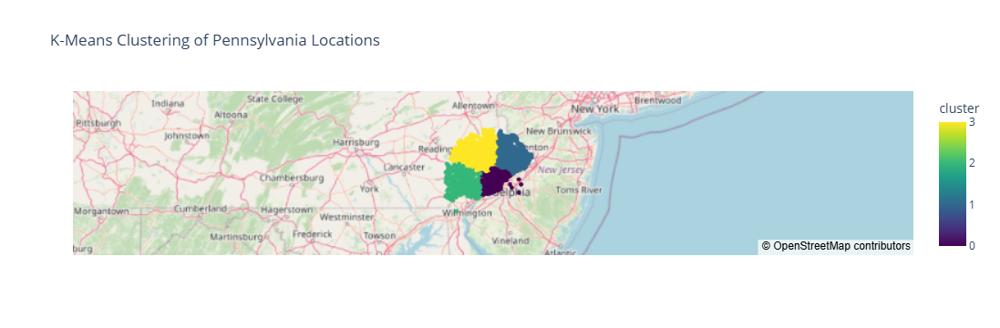

In [175]:
# Step 7: Using the optimal k, apply K-Means and visualize the clusters on a map
optimal_k = 4  # the optimal k is 4, based on the silhouette score

# Run K-Means with the chosen optimal k
pa_df = df[df['state'] == 'PA']
kmeans = KMeans(n_clusters=optimal_k, init='k-means++', max_iter=100, n_init=10, random_state=42)
pa_df['cluster'] = kmeans.fit_predict(X_scaled)

# Step 8: Visualize the clusters on a map using Plotly
fig = px.scatter_mapbox(pa_df, lat='latitude', lon='longitude', color='cluster', 
                        title='K-Means Clustering of Pennsylvania Locations',
                        color_continuous_scale="Viridis", zoom=6)

fig.update_layout(mapbox_style="open-street-map")
fig.show()

In [176]:
top_restaurants_pa = pa_df.sort_values(by=['review_count', 'stars'], ascending=False)
top_restaurants_pa.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,restaurants,cluster
143157,ytynqOUb3hjKeJfRj5Tshw,Reading Terminal Market,51 N 12th St,Philadelphia,PA,19107,39.953341,-75.158855,4.5,5721,1,"{'RestaurantsGoodForGroups': 'True', 'Restaura...","Candy Stores, Shopping, Department Stores, Fas...","{'Monday': '8:0-18:0', 'Tuesday': '8:0-18:0', ...",True,0
113983,PP3BBaVxZLcJU54uP_wL6Q,Pat's King of Steaks,1237 E Passyunk Ave,Philadelphia,PA,19147,39.933201,-75.159266,3.0,4250,1,"{'RestaurantsReservations': 'False', 'Corkage'...","Italian, American (Traditional), Sandwiches, F...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W...",True,0
57332,IkY2ticzHEn4QFn8hQLSWg,Geno's Steaks,1219 S 9th St,Philadelphia,PA,19147,39.933837,-75.158814,2.5,3401,1,"{'RestaurantsReservations': 'False', 'Corkage'...","Sandwiches, Cheesesteaks, Steakhouses, Restaur...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W...",True,0
131670,9PZxjhTIU7OgPIzuGi89Ew,El Vez,121 S 13th St,Philadelphia,PA,19107,39.949702,-75.161770,4.0,3187,1,"{'RestaurantsReservations': 'True', 'BYOBCorka...","Lounges, Bars, Nightlife, Breakfast & Brunch, ...","{'Monday': '0:0-0:0', 'Tuesday': '12:0-22:0', ...",True,0
31165,ctHjyadbDQAtUFfkcAFEHw,Zahav,237 St James Pl,Philadelphia,PA,19106,39.946261,-75.145135,4.5,3065,1,"{'RestaurantsAttire': ''casual'', 'BikeParking...","Nightlife, Bars, Food, Ethnic Food, Middle Eas...","{'Monday': '0:0-0:0', 'Tuesday': '16:45-21:30'...",True,0


Function for Recommend Restaurants

In [177]:
def recommend_restaurants(df, longitude, latitude, kmeans):
    # Predict the cluster for the given longitude and latitude
    cluster = kmeans.predict(np.array([longitude, latitude]).reshape(1, -1))[0]
    print(f"Predicted cluster: {cluster}")

    # Check if the predicted cluster is valid (exists in the df)
    if cluster not in df['cluster'].unique():
        raise ValueError(f"Predicted cluster {cluster} does not exist in the data.")
    
    # Get the number of restaurants in the predicted cluster
    cluster_size = df[df['cluster'] == cluster].shape[0]
    print(f"Number of restaurants in cluster {cluster}: {cluster_size}")

    # If there are no restaurants in the predicted cluster, return an empty DataFrame
    if cluster_size == 0:
        print("No restaurants found in this cluster.")
        return pd.DataFrame()  # Return an empty DataFrame
    
    # Get the top 5 restaurants from the predicted cluster
    top_restaurants = df[df['cluster'] == cluster].iloc[:5][['name', 'latitude', 'longitude']]
    
    return top_restaurants


In [178]:
longitude = -75.1652  # Example longitude
latitude = 39.9526    # Example latitude

recommended = recommend_restaurants(top_restaurants_pa, longitude, latitude, kmeans)
print(recommended)


Predicted cluster: 0
Number of restaurants in cluster 0: 17105
                           name   latitude  longitude
143157  Reading Terminal Market  39.953341 -75.158855
113983     Pat's King of Steaks  39.933201 -75.159266
57332             Geno's Steaks  39.933837 -75.158814
131670                   El Vez  39.949702 -75.161770
31165                     Zahav  39.946261 -75.145135


In [182]:
def recommend_and_plot_map(user_latitude, user_longitude, df, kmeans_model, top_n=5):
    # Predict the cluster for the user's location
    user_cluster = kmeans_model.predict(np.array([user_longitude, user_latitude]).reshape(1, -1))[0]
    print(f"Predicted cluster for user location: {user_cluster}")
    
    # Filter restaurants that belong to the same cluster as the user and sort values by stars
    cluster_restaurants = df[df['cluster'] == user_cluster]
    
    top_restaurants = cluster_restaurants.sort_values(by='stars', ascending=False).head(top_n)
    
    # Create a base map centered around the user's location
    user_map = folium.Map(location=[user_latitude, user_longitude], zoom_start=13)
    
    # Add a marker for the user's location
    folium.Marker(
        location=[user_latitude, user_longitude],
        popup="Your Location",
        icon=folium.Icon(color='blue')
    ).add_to(user_map)
    
    # Add markers for the top recommended restaurants in the same cluster
    for _, row in top_restaurants.iterrows():
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=f"{row['name']} - {row['stars']} stars",
            icon=folium.Icon(color='green')
        ).add_to(user_map)
    
    return user_map

In [188]:
user_latitude = 39.9526  # Example latitude 
user_longitude = -75.1652  # Example longitude

# Plot the map with recommendations
map_with_recommendations = recommend_and_plot_map(user_latitude, user_longitude, top_restaurants_pa, kmeans)

# Display the map 
map_with_recommendations


Predicted cluster for user location: 0


## Conclusion

The Restaurant Recommendation Engine successfully demonstrates the application of data analysis and machine learning techniques to provide personalized restaurant recommendations. 

Key takeaways from the project include:

1. **Data Exploration**: The exploratory data analysis revealed important trends in restaurant ratings, allowing us to visualize the distribution of stars and identify top-rated establishments. This step is crucial for understanding the dataset and informing subsequent modeling decisions.

2. **Clustering with K-Means**: The implementation of K-Means clustering enabled us to categorize restaurants based on their geographical locations. By analyzing silhouette scores, we determined the optimal number of clusters, which enhances the accuracy of our recommendations.

3. **Personalized Recommendations**: The recommendation functions developed in this project allow users to receive tailored suggestions based on their specific locations. This feature not only improves user experience but also helps users discover new dining options that align with their preferences.

4. **Interactive Visualizations**: The use of Plotly and Folium for visualizing restaurant locations and clusters provides an engaging way for users to explore the data. Interactive maps enhance the usability of the application, making it easier for users to find recommended restaurants in their vicinity.

Overall, this project highlights the potential of combining data science and machine learning to create practical applications that enhance everyday decision-making. Future work could involve incorporating additional features, such as user reviews and preferences, to further refine the recommendation process and improve user satisfaction.